# Testing and comparing eigendecompositions of affinity and laplacians

Let's test the eigendecomposition of some affinity matrices and graph Laplacians. We'll also visualize their spectra, compute their spectral gap and make some considerations about centrality, connected components and other properties of a graph.

In [1]:
import numpy as np
from scipy.sparse import find, csr_matrix
import topo as tp
from  matplotlib import pyplot as plt
from sklearn.datasets import fetch_openml, load_digits

In [2]:
# Load some toy data (MNIST digits)
X, labels = fetch_openml('mnist_784', version=1, return_X_y=True)
#X, labels = load_digits(return_X_y=True)

# Convert to sparse
X = csr_matrix(X)

# Compute a k-nearest-neighbors graph
knn = tp.ann.kNN(X, metric='cosine', n_neighbors=10, n_jobs=-1)

In [3]:
# Redefining kernel functions
#import numpy as np
#from scipy.sparse import find, csr_matrix

def _adap_bw(K, n_neighbors):
    median_k = np.floor(n_neighbors/2).astype(int)
    adap_sd = np.zeros(K.shape[0])
    for i in np.arange(len(adap_sd)):
        adap_sd[i] = np.sort(K.data[K.indptr[i]: K.indptr[i + 1]])[median_k - 1]
    return adap_sd

def compute_kernel(X, metric='cosine',
                     n_neighbors=10, adaptive_bw=True,
                 expand_nbr_search=False, alpha_decaying=False, return_densities=False, symmetrize=True,
                  **kwargs):
    """
    Compute a kernel matrix from a set of points.

    Parameters
    ----------
    X : array-like, shape (n_samples, n_features)
        The set of points to compute the kernel matrix for. Accepts np.ndarrays and scipy.sparse matrices.
        If precomputed, assumed to be a square symmetric semidefinite matrix.
    metric : string, optional
        The metric to use when computing the kernel matrix.
        Possible values are: 'cosine', 'euclidean' and others. Accepts precomputed distances.
    n_neighbors : int, optional
        The number of neighbors to use when computing the kernel matrix.
    adaptive_bw : bool, optional
        Whether to use an adaptive bandwidth based on the distance to median k-nearest-neighbor.
    expand_nbr_search : bool, optional
        Whether to expand the neighborhood search (mitigates a choice of too small a number of k-neighbors).
    alpha_decaying : bool, optional
        Whether to use an adaptively decaying kernel.
    return_densities : bool, optional
        Whether to return the bandwidth metrics as a dictinary. If set to `True`, the function
        returns a tuple containing the kernel matrix and a dictionary containing the
        bandwidth metric.
    symmetrize : bool, optional
        Whether to symmetrize the kernel matrix after normalizations.
    **kwargs : dict, optional

    Returns
    -------
    K : array-like, shape (n_samples, n_samples)
        The kernel matrix.
    densities : dict, optional
        A dictionary containing the bandwidth metrics.

    """
    k = n_neighbors
    if metric == 'precomputed':
        K = X
        expand_nbr_search = False
    else:
        K = tp.ann.kNN(X, metric=metric, n_neighbors=k, **kwargs)
    if adaptive_bw:
        adap_sd = _adap_bw(K, k)
        # Get an indirect measure of the local density
        pm = np.interp(adap_sd, (adap_sd.min(), adap_sd.max()), (2, k))
        if expand_nbr_search:
            new_k = int(k + (k - pm.max()))
            K = tp.ann.kNN(X, metric=metric, k=new_k, **kwargs)
            adap_sd_new = _adap_bw(K, new_k)
            # Get an indirect measure of the local density
            pm_new = np.interp(adap_sd_new, (adap_sd_new.min(), adap_sd_new.max()), (2, new_k))
    x, y, dists = find(K)
    # Normalize distances
    if adaptive_bw:
        # Alpha decaying: the kernel adaptively decays depending on neighborhood density
        if alpha_decaying:
            if expand_nbr_search:
                dists = (dists / (adap_sd_new[x] + 1e-10)) ** np.power(2,((new_k - pm_new[x]) / pm_new[x]))
            else:
                dists = (dists / (adap_sd[x] + 1e-10)) ** np.power(2,((k - pm[x]) / pm[x]))
        else:
            if expand_nbr_search:
                dists = (dists / (adap_sd_new[x] + 1e-10))
            else:
                dists = (dists / (adap_sd[x] + 1e-10))
    kernel = csr_matrix((np.exp(-dists), (x, y)), shape=K.shape)
    if symmetrize:
        kernel = (kernel + kernel.T) / 2
        kernel[(np.arange(kernel.shape[0]), np.arange(kernel.shape[0]))] = 0
        # handle nan, zeros
        kernel.data = np.where(np.isnan(kernel.data), 1, kernel.data)
    if not return_densities:
        return kernel
    else:
        if not adaptive_bw:
            return kernel, None
        else:
            dens_dict = {}
            dens_dict['omega'] = pm
            dens_dict['adaptive_bw'] = adap_sd
            if expand_nbr_search:
                dens_dict['omega_new'] = pm_new
                dens_dict['adaptive_bw_new'] = adap_sd_new
            return kernel, dens_dict


In [4]:
# Compute some affinity matrices with different kernel methods
from topo.tpgraph.cknn import cknn_graph
from topo.tpgraph.fuzzy import fuzzy_simplicial_set_ann
from topo.spectral import graph_laplacian, diffusion_operator, LE, LapEigenmap, spectral_layout
#
cknn = cknn_graph(X, n_neighbors=10, metric='cosine')
#
fss_results = fuzzy_simplicial_set_ann(X, n_neighbors=10, metric='cosine')
fss = fss_results[0]
#
simple = compute_kernel(knn, metric='precomputed', adaptive_bw=False)
adap_bw, adap_bw_dens = compute_kernel(knn, metric='precomputed', adaptive_bw=True, alpha_decaying=False, return_densities=True)
#
adap_bw_alpha_decaying, adap_bw_alpha_decaying_dens = compute_kernel(knn, metric='precomputed', adaptive_bw=True, alpha_decaying=True, return_densities=True)
adap_bw_alpha_decaying_nbr_exp, adap_bw_alpha_decaying_nbr_exp_dens = compute_kernel(X, metric='cosine', adaptive_bw=True, alpha_decaying=True, expand_nbr_search=True, return_densities=True)
#

In [5]:
# List affinity matrices
affinities = [cknn, fss, simple, adap_bw, adap_bw_alpha_decaying, adap_bw_alpha_decaying_nbr_exp]
# Compute graph Laplacians
#
# unnormalized
unnorm_lap = []
for aff in affinities:
    unnorm_lap.append(graph_laplacian(aff, laplacian='unnormalized'))
#
# symmetric normalized
sym_norm_lap = []
for aff in affinities:
    sym_norm_lap.append(graph_laplacian(aff, laplacian='symmetric'))
#
# random walk
rw_lap = []
for aff in affinities:
    rw_lap.append(graph_laplacian(aff, laplacian='random_walk'))
#
# normalized, scipy implementation
from scipy.sparse.csgraph import laplacian
sp_lap = []
for aff in affinities:
    sp_lap.append(laplacian(aff, normed=True, return_diag=False))
#
# Compute diffusion operators
diff_op = []
d_lefts = []
for aff in affinities:
    #op = diffusion_operator(aff, alpha=1, symmetric=False, return_D_inv_sqrt=False)
    # Note we return D_left to convert the eigenvectors back as we're using the symmetric version    
    op, d_left = diffusion_operator(aff, alpha=1, symmetric=True, return_D_inv_sqrt=True)
    diff_op.append(op)
    d_lefts.append(d_left)


In [6]:
# Define Laplacian eigenmaps
def compute_LE(lap, n_eigs=2, return_evals=True, tol=0, drop_first=True):
    if drop_first:
        n_eigs = n_eigs + 1
    num_lanczos_vectors = max(2 * n_eigs + 1, int(np.sqrt(lap.shape[0])))
    evals, evecs = eigsh(lap, k=n_eigs, which='SM', ncv=num_lanczos_vectors, tol=tol)
    evals = np.real(evals)
    evecs = np.real(evecs)
    # Sort eigenvalues and eigenvectors in ascending order
    idx = evals.argsort()
    evals = evals[idx]
    evecs = evecs[:, idx]
    # Return embedding and evals
    if drop_first:
        evecs = evecs[:, 1:]
        evals = evals[1:]
    if return_evals:
        return evecs, evals
    else:
        return evecs

# Compute Diffusion Maps
def compute_DM(diff_op, D_tilde=None, n_eigs=2, return_evals=True, tol=0, t=1):
    num_lanczos_vectors = max(2 * n_eigs + 1, int(np.sqrt(lap.shape[0])))
    evals, evecs = eigsh(diff_op, k=n_eigs, which='LM', ncv=num_lanczos_vectors, tol=tol)
    evals = np.real(evals)
    evecs = np.real(evecs)
    # If D-tilde is given, we assume the symmetrized version was used
    if D_tilde is not None:
        evecs = D_tilde.dot(evecs)
    # Sort eigenvalues and eigenvectors in descending order
    idx = evals.argsort()[::-1]
    evals = evals[idx]
    evecs = evecs[:, idx]
    # Normalize
    for i in range(evecs.shape[1]):
        evecs[:, i] = evecs[:, i] / np.linalg.norm(evecs[:, i])
    if t > 1:
        evals = np.power(evals, t)
    diffmap = evecs * evals
    if return_evals:
        return diffmap, evals
    else:
        return diffmap     

In [7]:
# Compute eigendecompositions of all these matrices
from scipy.sparse.linalg import eigsh
# Affinities
aff_evecs = []
aff_evals = []
for aff in affinities:
    evals, evecs = eigsh(aff, k=30, which='LM')
    # Sort eigenvalues and eigenvectors in descending order
    idx = evals.argsort()[::-1]
    evals = evals[idx]
    evecs = evecs[:, idx]
    aff_evecs.append(evecs)
    aff_evals.append(evals)
#
# unnormalized laplacians
unnorm_lap_evecs = []
unnorm_lap_evals = []
for lap in unnorm_lap:
    evecs, evals = compute_LE(lap, n_eigs=30, return_evals=True)
    unnorm_lap_evecs.append(evecs)
    unnorm_lap_evals.append(evals)
#
# symmetric normalized laplacians
sym_norm_lap_evecs = []
sym_norm_lap_evals = []
for lap in sym_norm_lap:
    evecs, evals = compute_LE(lap, n_eigs=30, return_evals=True)
    sym_norm_lap_evecs.append(evecs)
    sym_norm_lap_evals.append(evals)
#
# random walk laplacians
rw_lap_evecs = []
rw_lap_evals = []
for lap in rw_lap:
    evecs, evals = compute_LE(lap, n_eigs=30, return_evals=True)
    rw_lap_evecs.append(evecs)
    rw_lap_evals.append(evals)
#
# diffusion operators -> diffusion maps
diff_op_evecs = []
diff_op_evals = []
for i in np.arange(len(diff_op)):
    #evecs, evals = compute_DM(diff_op[i], n_eigs=30, return_evals=True)
    evecs, evals = compute_DM(diff_op[i], d_lefts[i], n_eigs=30, return_evals=True)
    diff_op_evecs.append(evecs)
    diff_op_evals.append(evals)
#
evecs_dict = {
     'Affinity':aff_evecs,
     'Unnormalized Laplacian':unnorm_lap_evecs,
     'Symmetric Norm Laplacian':sym_norm_lap_evecs,
     'Random Walk Laplacian':rw_lap_evecs,
     'Diffusion Maps':diff_op_evecs     
     }
#
evals_dict = {
     'Affinity':aff_evals,
     'Unnormalized Laplacian':unnorm_lap_evals,
     'Symmetric Norm Laplacian':sym_norm_lap_evals,
     'Random Walk Laplacian':rw_lap_evals,
     'Diffusion Maps':diff_op_evals     
     }

In [8]:
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline

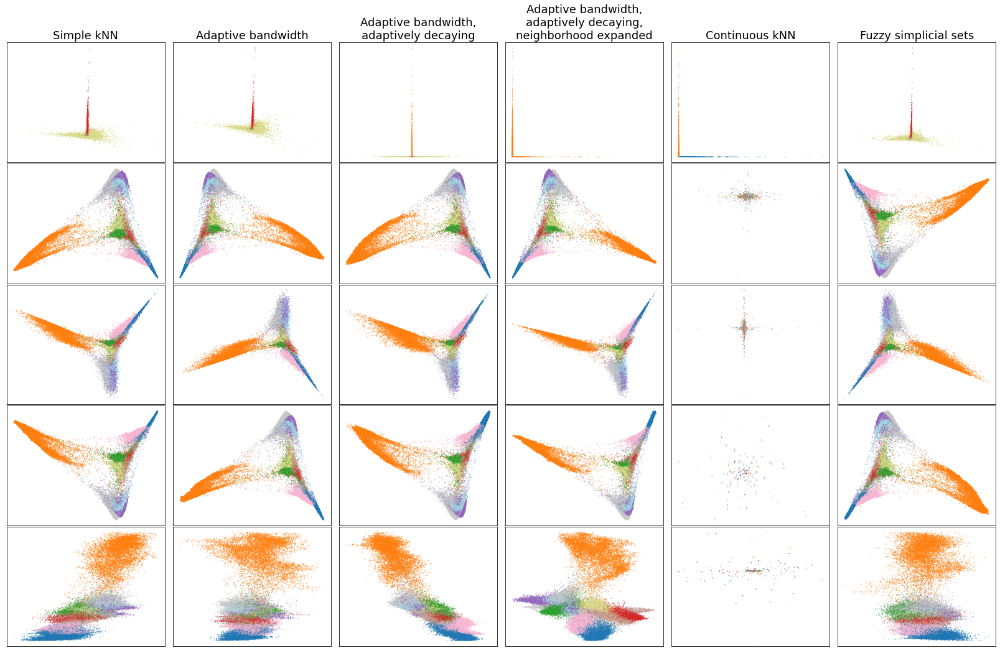

In [9]:
# Plot 2 first evecs of each
plt.figure(figsize=(9 * 2 + 5, 15))
plt.subplots_adjust(
    left=0.02, right=0.98, bottom=0.001, top=0.9, wspace=0.05, hspace=0.01
)
plot_num = 1
for i_eigs, eig_name in enumerate(evecs_dict):
    evecs_list = evecs_dict[eig_name]
    aff_methods = (
        ("Simple kNN", evecs_list[2]),
        ("Adaptive bandwidth", evecs_list[3]),
        ("Adaptive bandwidth,\nadaptively decaying", evecs_list[4]),
        ("Adaptive bandwidth,\nadaptively decaying,\nneighborhood expanded", evecs_list[5]),
        ("Continuous kNN", evecs_list[0]),
        ("Fuzzy simplicial sets", evecs_list[1])
    )
    for name, evecs in aff_methods:
        plt.subplot(len(evecs_dict), len(aff_methods), plot_num)
        if i_eigs == 0:
            plt.title(name, size=18)
            if name not in  ["Continuous kNN", "Adaptive bandwidth,\nadaptively decaying,\nneighborhood expanded"]:
                plt.scatter(evecs[:, 1], evecs[:, 2], s=0.1, c=labels.to_numpy().astype(int), cmap='tab20')
            else:
                plt.scatter(evecs[:, 0], evecs[:, 1], s=0.1, c=labels.to_numpy().astype(int), cmap='tab20')
        else:
            plt.scatter(evecs[:, 0], evecs[:, 1], s=0.1, c=labels.to_numpy().astype(int), cmap='tab20')
        plt.xticks(())
        plt.yticks(())
        plot_num += 1
plt.savefig('/home/davi/Bioinfo/TopOMetry_Paper/Affinity_laplacian_decompositions_visual_MNIST70K.png', dpi=600)
plt.show()

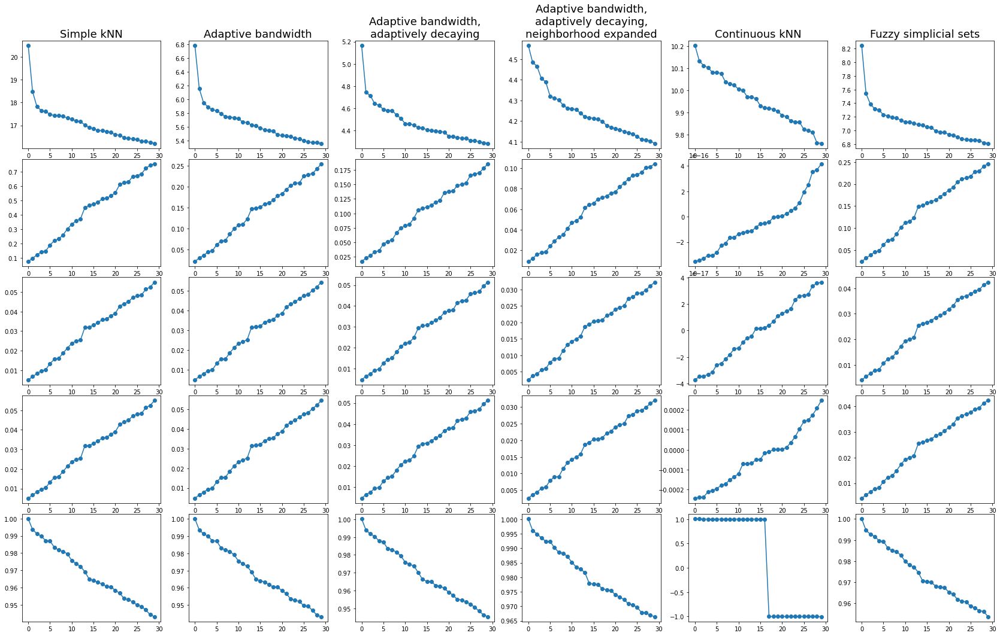

In [10]:
# Plot spectrum of each
plt.figure(figsize=(9 * 2 + 5, 15))
plt.subplots_adjust(
    left=0.01, right=0.99, bottom=0.001, top=0.9, wspace=0.2, hspace=0.1
)
plot_num = 1
for i_eigs, eig_name in enumerate(evals_dict):
    evals_list = evals_dict[eig_name]
    aff_methods = (
        ("Simple kNN", evals_list[2]),
        ("Adaptive bandwidth", evals_list[3]),
        ("Adaptive bandwidth,\nadaptively decaying", evals_list[4]),
        ("Adaptive bandwidth,\nadaptively decaying,\nneighborhood expanded", evals_list[5]),
        ("Continuous kNN", evals_list[0]),
        ("Fuzzy simplicial sets", evals_list[1])
    )

    for name, evals in aff_methods:
        plt.subplot(len(evals_dict), len(aff_methods), plot_num)
        if i_eigs == 0:
            plt.title(name, size=18)
        plt.plot(range(0, len(evals)), evals, marker='o')
        #plt.xticks(())
        #plt.yticks(())
        #plt.text(
        #    0.99,
        #    0.01,
        #    ("%.2fs" % (t1 - t0)).lstrip("0"),
        #    transform=plt.gca().transAxes,
        #    size=15,
        #    horizontalalignment="right",
        #)
        plot_num += 1
plt.savefig('/home/davi/Bioinfo/TopOMetry_Paper/Affinity_laplacian_decompositions_spectrum_MNIST70K.png', dpi=600)
plt.show()

Now that we've explored the spectrum of these different affinity matrices, let's explore how their eigenvectors define natural harmonics of the data graph:

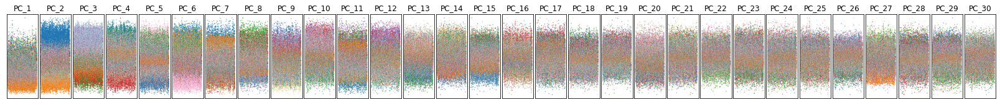

In [14]:
# First, an example highlighting how poorly PCA works on such datasets
# AKA 'This is bullshit'
from sklearn.decomposition import TruncatedSVD
pcs = TruncatedSVD(n_components=30).fit_transform(X)

plt.figure(figsize=(9 * 2 + 5, 2))
plt.subplots_adjust(
    left=0.02, right=0.98, bottom=0.001, top=0.95, wspace=0.05, hspace=0.01
)
plot_num = 1
for i in range(0, pcs.shape[1]):
    plt.subplot(1, pcs.shape[1], plot_num)
    plt.title('PC_' + str(plot_num))
    plt.scatter(range(0, pcs.shape[0]), pcs[:,i], s=0.1, c=labels.to_numpy().astype(int), cmap='tab20')
    plot_num += 1
    plt.xticks(())
    plt.yticks(())

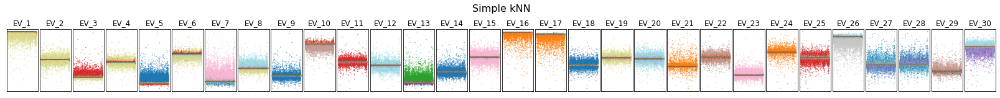

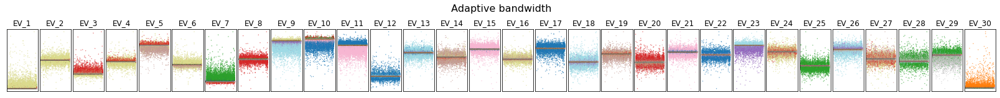

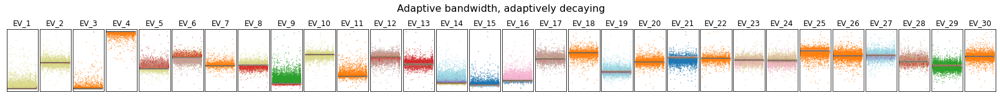

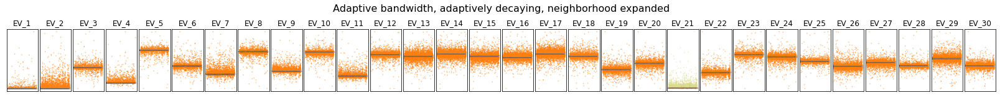

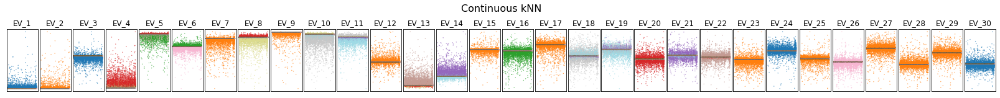

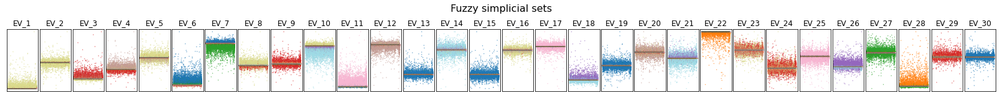

In [20]:
# evecs_dict = {
#      'Affinity':aff_evecs,
#      'Unnormalized Laplacian':unnorm_lap_evecs,
#      'Symmetric Norm Laplacian':sym_norm_lap_evecs,
#      'Random Walk Laplacian':rw_lap_evecs,
#      'Diffusion Maps':diff_op_evecs     
#      }

evecs_list = evecs_dict['Affinity']
aff_methods = (
    ("Simple kNN", evecs_list[2]),
    ("Adaptive bandwidth", evecs_list[3]),
    ("Adaptive bandwidth, adaptively decaying", evecs_list[4]),
    ("Adaptive bandwidth, adaptively decaying, neighborhood expanded",
     evecs_list[5]),
    ("Continuous kNN", evecs_list[0]),
    ("Fuzzy simplicial sets", evecs_list[1])
)
for name, evecs in aff_methods:
    plt.figure(figsize=(9 * 2 + 5, 2))
    plt.suptitle(name, size=16)
    plt.subplots_adjust(
         left=0.02, right=0.98, bottom=0.001, top=0.70, wspace=0.05, hspace=0.01
         )
    plot_num = 1
    for i in range(0, evecs.shape[1]):
        plt.subplot(1, evecs.shape[1], plot_num)
        plt.title('EV_' + str(plot_num))
        plt.scatter(
                range(0, len(evecs[:, i])), evecs[:, i], s=0.1, c=labels.to_numpy().astype(int), cmap='tab20')
        plot_num += 1
        plt.xticks(())
        plt.yticks(())
    plt.show()


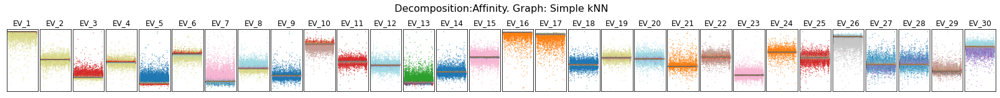

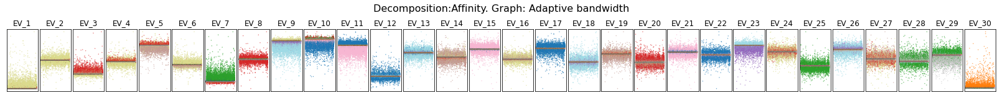

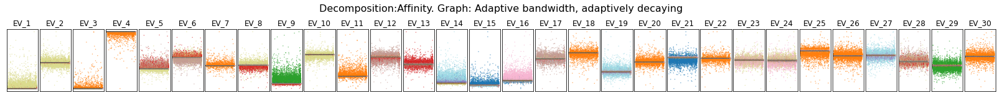

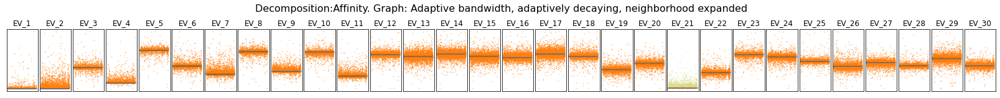

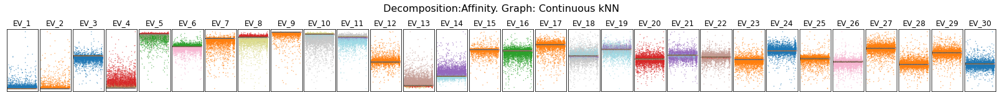

...

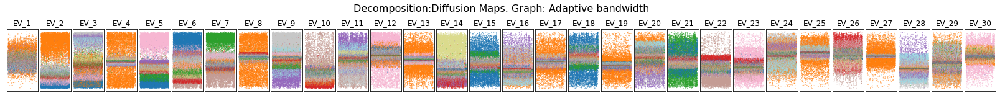

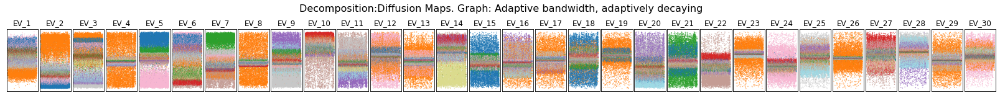

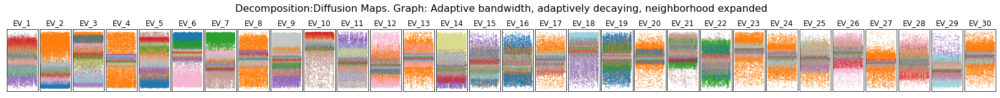

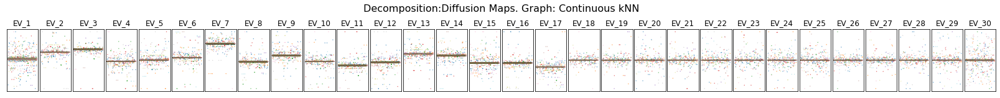

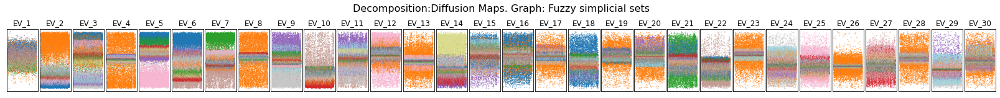

In [21]:
# Next, show how/well eigendecomp'
# AKA 'This is an work of art'
for i_eigs, eig_name in enumerate(evecs_dict):
    evecs_list = evecs_dict[eig_name]
    aff_methods = (
        ("Simple kNN", evecs_list[2]),
        ("Adaptive bandwidth", evecs_list[3]),
        ("Adaptive bandwidth, adaptively decaying", evecs_list[4]),
        ("Adaptive bandwidth, adaptively decaying, neighborhood expanded", evecs_list[5]),
        ("Continuous kNN", evecs_list[0]),
        ("Fuzzy simplicial sets", evecs_list[1])
    )
    for name, evecs in aff_methods:
        plt.figure(figsize=(9 * 2 + 5, 2))
        plt.suptitle('Decomposition:'+ eig_name + '. Graph: ' + name, size=16)
        plt.subplots_adjust(
            left=0.02, right=0.98, bottom=0.001, top=0.70, wspace=0.05, hspace=0.01
        )
+        plot_num = 1
        for i in range(0, evecs.shape[1]):
            plt.subplot(1, evecs.shape[1], plot_num)
            plt.title('EV_' + str(plot_num))
            plt.scatter(range(0, len(evecs[:,i])),evecs[:,i], s=0.1, c=labels.to_numpy().astype(int), cmap='tab20')
            plot_num += 1
            plt.xticks(())
            plt.yticks(())
        plt.show()